In [ ]:
from google.colab import files

In [ ]:
uploaded = files.upload()

Saving t1.jpg to t1.jpg


In [ ]:
from matplotlib.image import imread
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import cv2
import random

In [ ]:
def visualize(image):
    plt.figure(figsize=(12, 12))
    plt.imshow(image)

In [ ]:
image1 = cv2.cvtColor(cv2.imread("girl.jpg"), cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(cv2.imread("town_low.jpg"), cv2.COLOR_BGR2RGB)
im1 = cv2.cvtColor(cv2.imread("g1.jpg"), cv2.COLOR_BGR2RGB)
t1 = cv2.cvtColor(cv2.imread("t1.jpg"), cv2.COLOR_BGR2RGB)

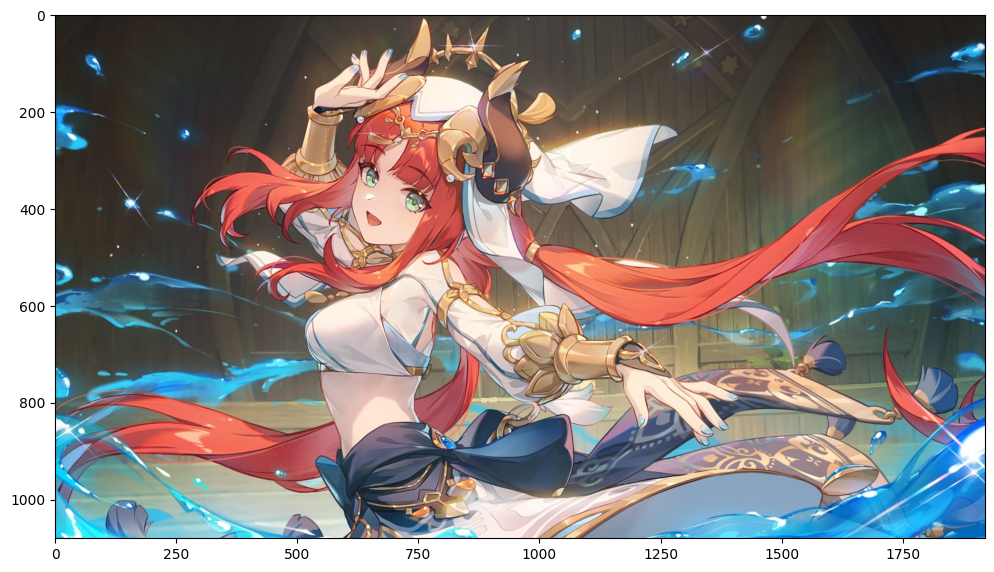

In [ ]:
visualize(image1)

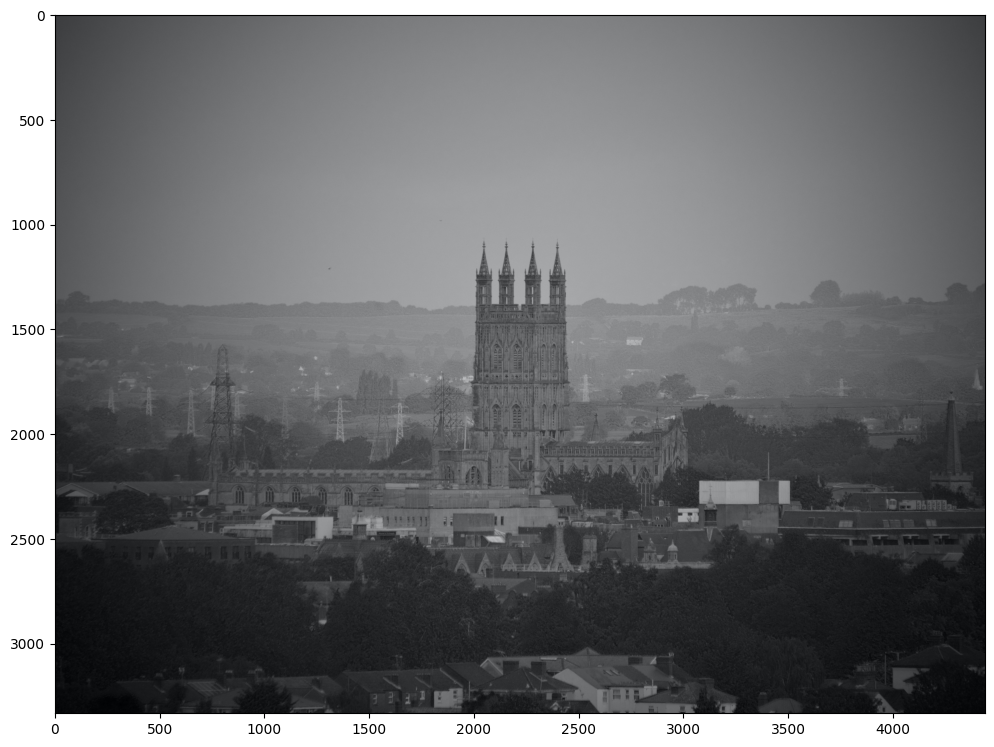

In [ ]:
visualize(image2)

In [ ]:
def destroy(image):
  rows, cols = image.shape[:2]
  M = np.float32([[1, 0, 500], [0, 1, 50]])
  img_shift = cv2.warpAffine(image, M, (cols, rows))
  flipped_img = cv2.flip(image, 0)
  #flipped_img = image[300:600, 500:800]
  #flipped_img = cv2.rotate(flipped_img, cv2.ROTATE_45_CLOCKWISE)
  return flipped_img

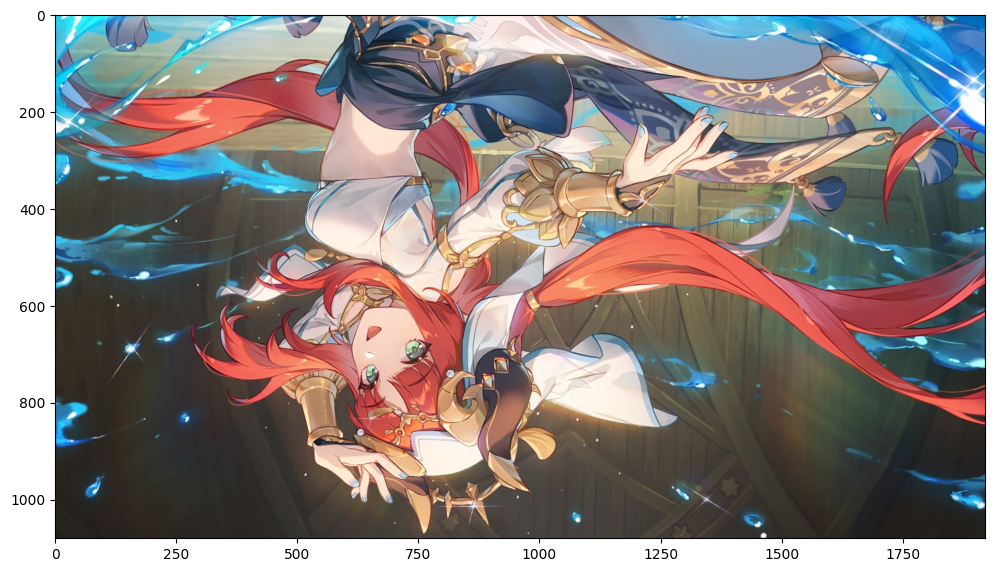

In [ ]:
im = destroy(image1)
visualize(im)

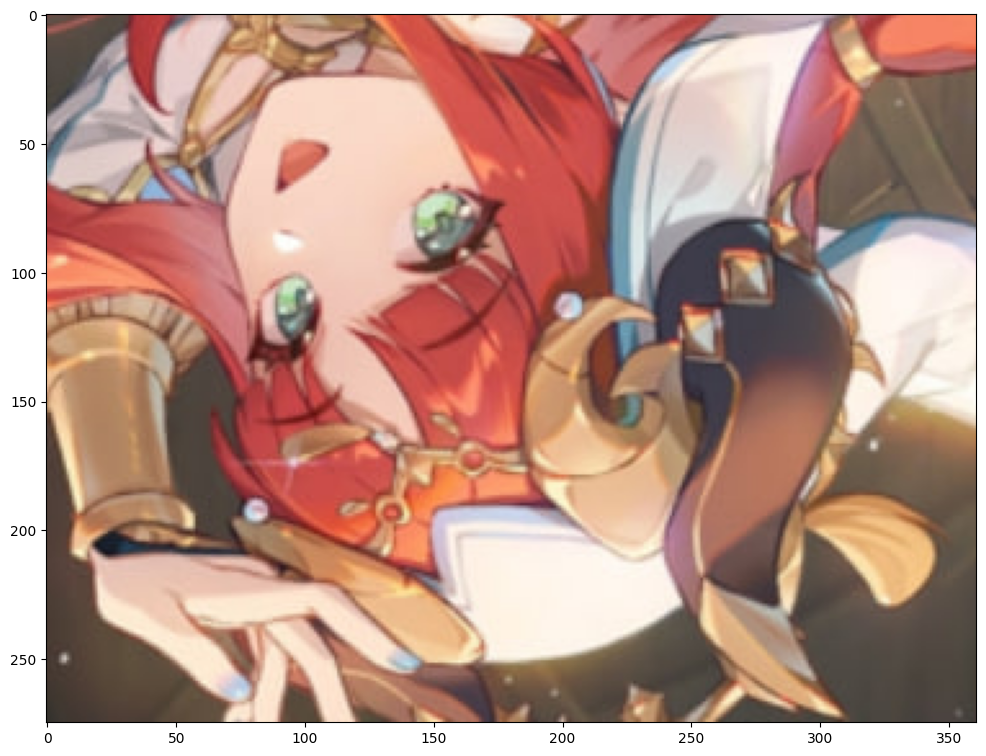

In [137]:
im11 = destroy(im1)
visualize(im11)

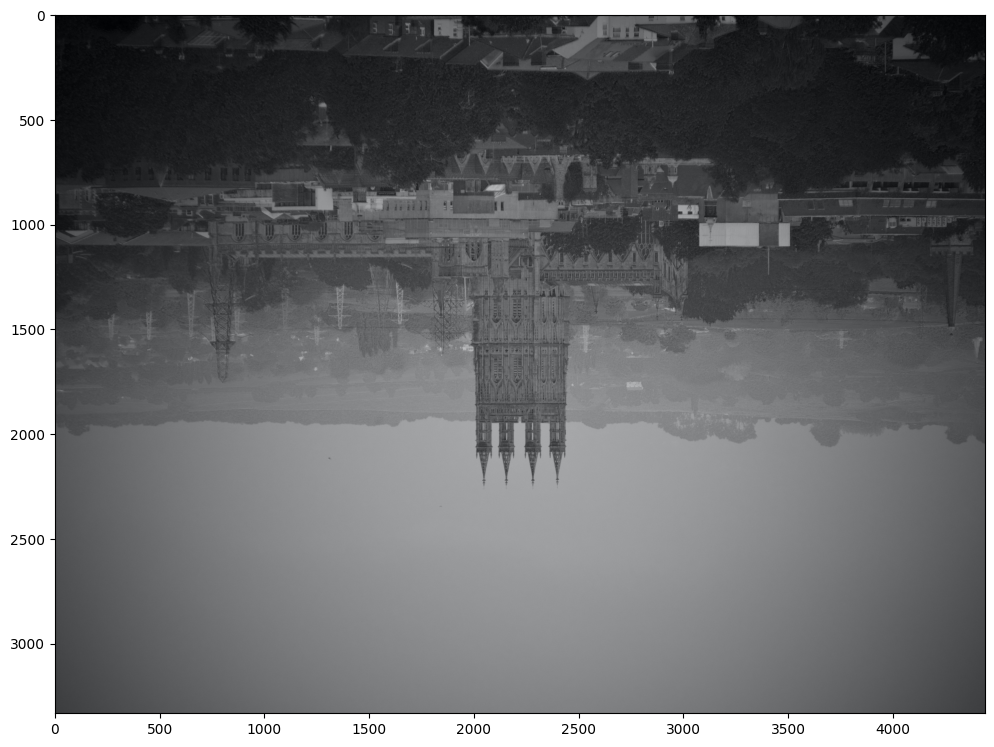

In [ ]:
im2 = destroy(image2)
visualize(im2)

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
def pca(des1, des2):
  des_norm1 = cv2.normalize(des1, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
  des_norm2 = cv2.normalize(des2, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
  n_components = 128  # Number of principal components to keep
  pca = PCA(n_components=n_components)
  des_pca1 = pca.fit_transform(des_norm1)
  des_pca2 = pca.fit_transform(des_norm2)
  new_des1 = des_pca1
  new_des2 = des_pca2

  return new_des1, new_des2

In [ ]:
def pca_sift_match(image, im, t, matches_number):
  # gray_image = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
  # gray_test_image = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
  sift = cv2.xfeatures2d.SIFT_create()
  matcher = cv2.FlannBasedMatcher_create()
  kp1, des1 = sift.detectAndCompute(image, None)
  kp2, des2 = sift.detectAndCompute(im, None)

  if t == 1:
    des1, des2 = pca(des1, des2)

  matcher = cv2.FlannBasedMatcher_create()
  matches = matcher.match(des1, des2)
  matches = sorted(matches, key=lambda x: x.distance)

  return cv2.drawMatches(image, kp1, im, kp2, matches[:matches_number], None, flags=4)

In [ ]:
import math

In [ ]:
def euclidean_norm(x, y):
    norm = 0.0
    for xi, yi in zip(x, y):
        norm += (xi - yi)**2
    norm = math.sqrt(norm)
    return norm

In [ ]:
def pca_sift_match_custom(image, im,t, matches_number):
  sift = cv2.xfeatures2d.SIFT_create()
  kp1, des1 = sift.detectAndCompute(image, None)
  kp2, des2 = sift.detectAndCompute(im, None)

  if t == 1:
    des1, des2 = pca(des1, des2)
  matches = []
  for i, d1 in enumerate(des1, start=0):
      for j, d2 in enumerate(des2, start=0):
          matches.append(cv2.DMatch(_trainIdx=j, _queryIdx=i, _distance=euclidean_norm(d1, d2), _imgIdx=0))

  matches = sorted(matches, key=lambda x: x.distance)

  return cv2.drawMatches(image, kp1, im, kp2, matches[:matches_number], None, flags=4)

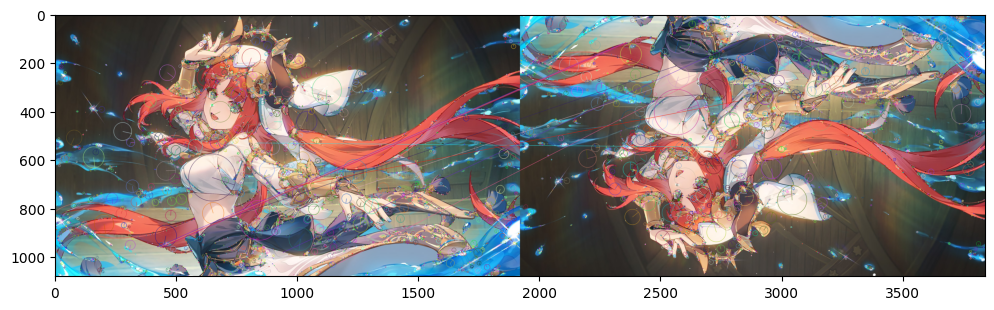

In [ ]:
visualize(image = pca_sift_match(image1, im, matches_number=10))

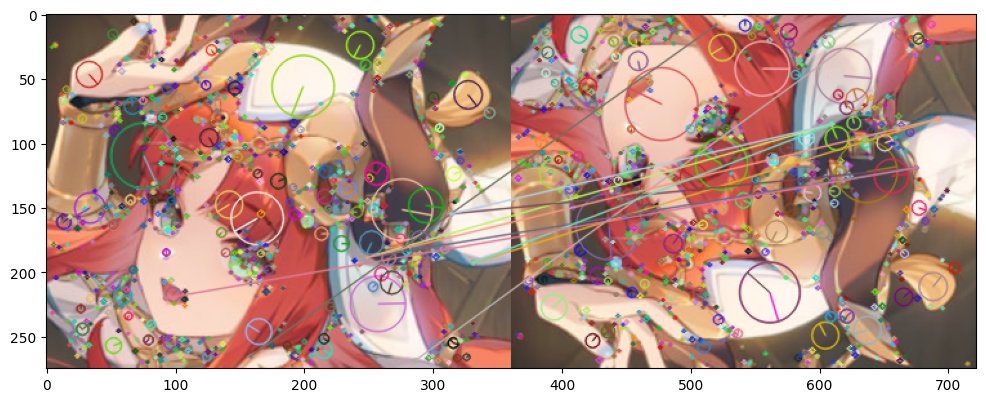

In [ ]:
visualize(image = pca_sift_match_custom(im1, im11, matches_number=10))

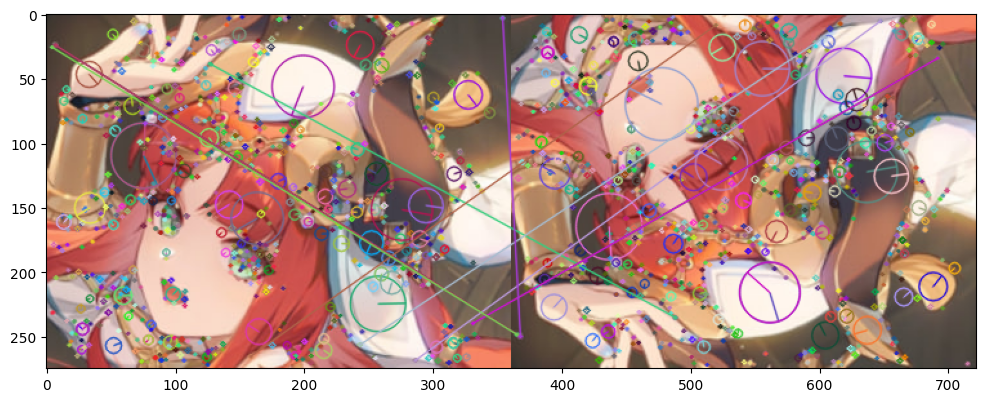

In [ ]:
visualize(image = pca_sift_match(im1, im11, matches_number=10))

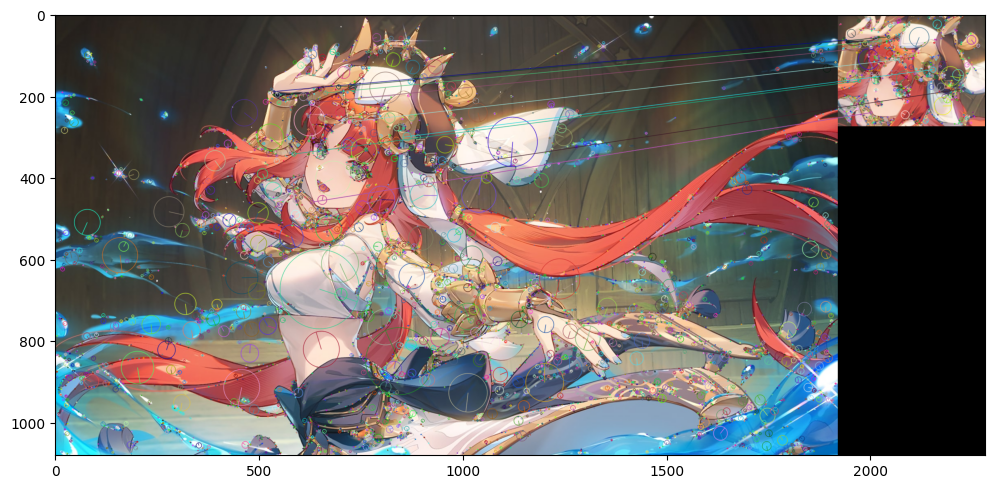

In [ ]:
visualize(image = pca_sift_match(image1, im1, matches_number=10))

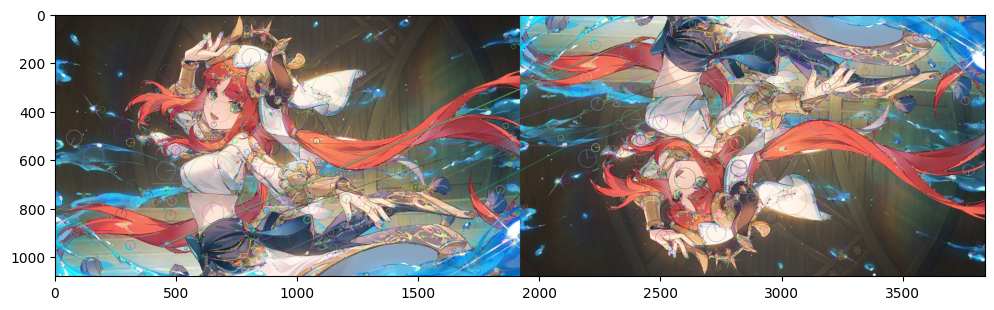

In [ ]:
visualize(image = pca_sift_match(image1, im, t=1, matches_number=10))

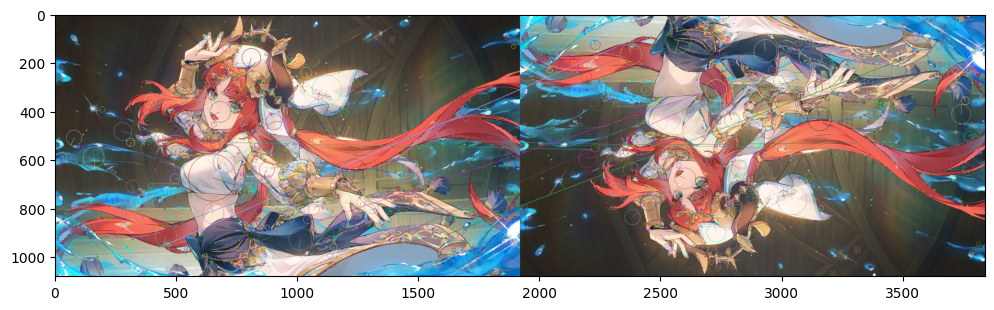

In [ ]:
visualize(image = pca_sift_match(image1, im,t=0, matches_number=10))

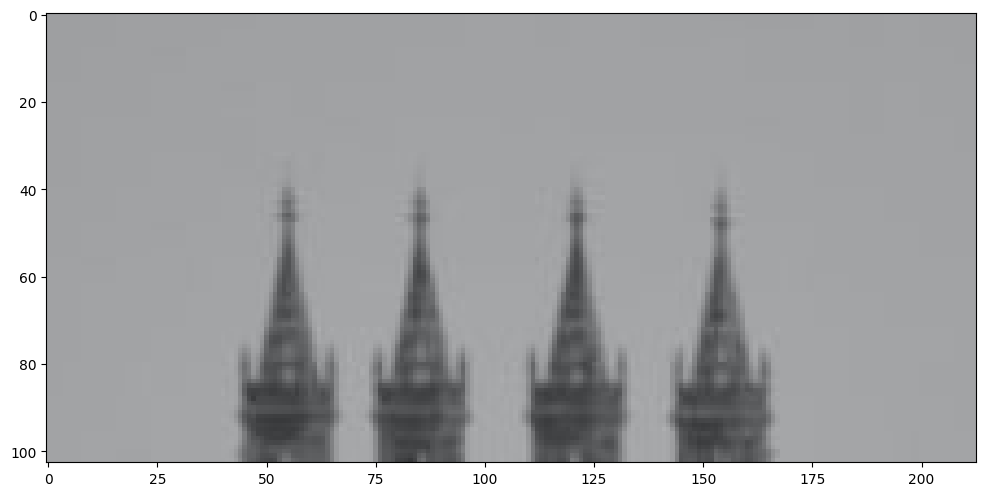

In [139]:
visualize(t1)

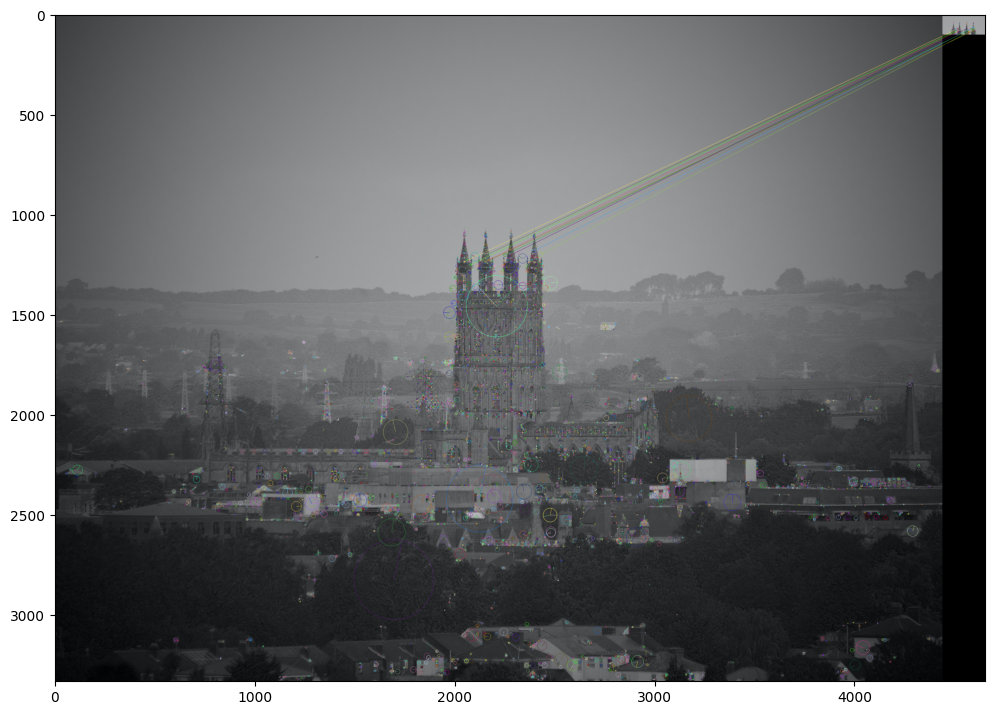

In [ ]:
visualize(image = pca_sift_match_custom(image2, t1,t=0, matches_number=10))

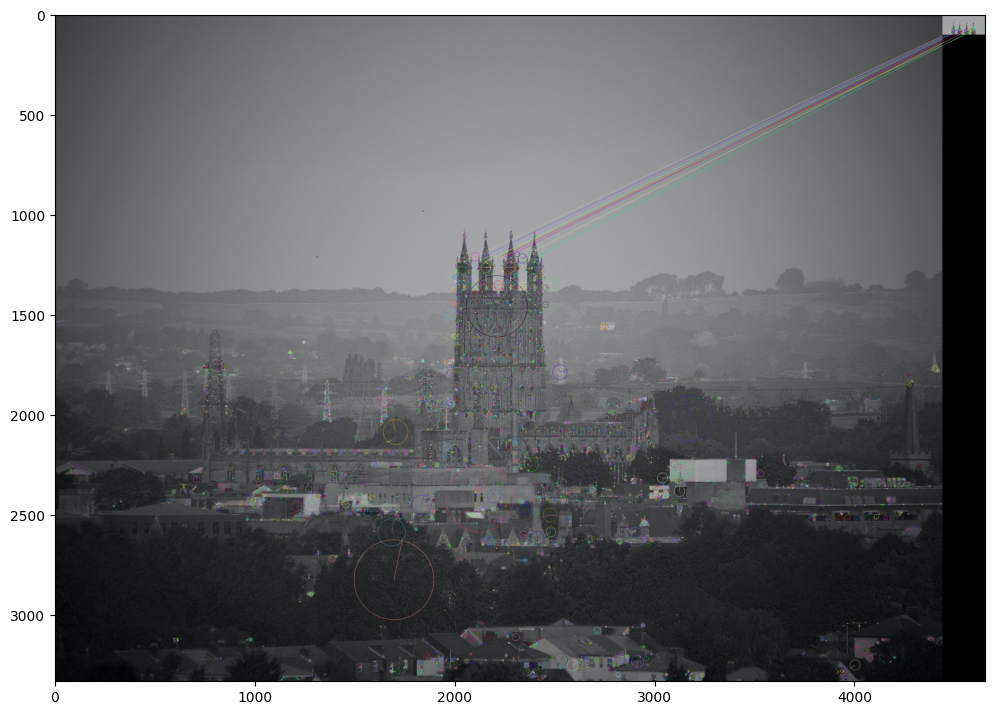

In [136]:
visualize(image = pca_sift_match(image2, t1,t=0, matches_number=10))